In [199]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
font = {'family' : 'sans',
        'weight' : 'normal',
        'size'   : 50}
matplotlib.rc('font', **font)
class OOMFormatter(matplotlib.ticker.ScalarFormatter):
    def __init__(self, order=6, fformat="%.2f", offset=True, mathText=True):
        self.oom = order
        self.fformat = fformat
        matplotlib.ticker.ScalarFormatter.__init__(self,useOffset=offset,useMathText=mathText)
    def _set_orderOfMagnitude(self, nothing):
        self.orderOfMagnitude = self.oom
    def _set_format(self):
        self.format = self.fformat
        if self._useMathText:
            self.format = '$%s$' % matplotlib.ticker._mathdefault(self.format)

In [200]:
def plot_cwnd(df, nflows, dt, ql, delay, flowid, subflows, directory=".", ncolors=None, ax=None, show=False,  
                    xlower=None, xupper=None, ylower=None, yupper=None, axformat=OOMFormatter(6, '%.2f'),
                    linewidth=1, linestyle="--", markersize=20, marker='.', mew=0, alpha=1, flowtype=""):
    sns.set_palette(sns.color_palette("husl", ncolors if ncolors != None else len(subflows)))
    tstamp = df[(df['dt']==dt)&(df['ql']==ql)&(df['delay']==delay)&(df['nflows']==nflows)]['tstamp']
    cwndfile = directory + "/cwndlog_" + tstamp.iat[0]
    cdata = pd.read_csv(cwndfile,  header=None, index_col=None, names=['t', 'flowid', 'subflow', 'cwnd'])
    sdf = cdata[(cdata['flowid']==flowid)]
    if ylower is None: 
        strlower = str(int(min(sdf['cwnd'])))
        ylower = 0 if len(strlower)<=1 else (int(strlower[0:2]))*10**(len(strlower)-2)
    if yupper is None:
        strupper = str(int(max(sdf['cwnd'])))
        yupper = (int(strupper[0])+1) if len(strupper)<=1 else (int(strupper[0:2])+1)*10**(len(strupper)-2)
    if xlower is None: 
        strlower = str(int(min(sdf['t'])))
        xlower = 0 if len(strlower)<=1 else (int(strlower[0:2]))*10**(len(strlower)-2)
    if xupper is None:
        strupper = str(int(max(sdf['t'])))
        xupper = (int(strupper[0])+1) if len(strupper)<=1 else (int(strupper[0:2])+1)*10**(len(strupper)-2)
    for n in subflows:
        msdf = sdf[sdf['subflow']==n]
        ax = msdf.plot(ax=ax, x='t', y='cwnd', 
                             title='dt: '+str(dt)+', ql: '+str(ql)+', delay: '+str(delay)+'us'+", nflows: " +str(nflows)+"flowid: "+str(flowid),
                             linewidth=linewidth, linestyle=linestyle, marker=marker, markersize=markersize,
                             xlim=(xlower, xupper), logx=False, ylim=(ylower, yupper), mew=mew, alpha=alpha,
                             figsize=(9,6), label='subflows'+str(n))
        ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
        ax.grid(True, which='minor', axis='x', linestyle='dotted')
        ax.grid(True, which='major', axis='x', linestyle='dotted')
        ax.grid(True, which='minor', axis='y', linestyle='dotted')
        ax.grid(True, which='major', axis='y', linestyle='dotted')
        ax.set_xlabel('time (us)')
        ax.set_ylabel('cwnd')
        ax.yaxis.set_major_formatter(axformat)
    if show:
        plt.show()
    else:
        return ax
    

In [201]:
def plot_state(df, nflows, dt, ql, delay, flowid, subflows, directory=".", ncolors=None, ax=None, show=False,  
                    xlower=None, xupper=None, axformat=OOMFormatter(6, '%.2f'),
                    linewidth=1, linestyle=":", markersize=5, marker='.', mew=0, alpha=1):
    sns.set_palette(sns.color_palette("husl", ncolors if ncolors != None else len(subflows)))
    tstamp = df[(df['dt']==dt)&(df['ql']==ql)&(df['delay']==delay)&(df['nflows']==nflows)]['tstamp']
    cwndfile = directory + "/congStatelog_" + tstamp.iat[0]
    cdata = pd.read_csv(cwndfile,  header=None, index_col=None, names=['t', 'flowid', 'subflow', 'csfrom', 'csto'])
    sdf = cdata[(cdata['flowid']==flowid)]
    if xlower is None: 
        strlower = str(int(min(sdf['t'])))
        xlower = 0 if len(strlower)<=1 else (int(strlower[0:2]))*10**(len(strlower)-2)
    if xupper is None:
        strupper = str(int(max(sdf['t'])))
        xupper = (int(strupper[0])+1) if len(strupper)<=1 else (int(strupper[0:2])+1)*10**(len(strupper)-2)
    for n in subflows:
        msdf = sdf[sdf['subflow']==n]
        ax = msdf.plot(ax=ax, x='t', y='csto', 
                             title='dt: '+str(dt)+', ql: '+str(ql)+', delay: '+str(delay)+'us'+", nflows: " +str(nflows)+"flowid: "+str(flowid),
                             linewidth=linewidth, linestyle=linestyle, marker=marker, markersize=markersize,
                             xlim=(xlower, xupper), logx=False, ylim=(-1, 5), mew=mew, alpha=alpha,
                             figsize=(9,6), label='subflows'+str(n))
        ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
        ax.grid(True, which='minor', axis='x', linestyle='dotted')
        ax.grid(True, which='major', axis='x', linestyle='dotted')
        ax.grid(True, which='minor', axis='y', linestyle='dotted')
        ax.grid(True, which='major', axis='y', linestyle='dotted')
        ax.set_xlabel('time (us)')
        ax.set_ylabel('state')
#         ax.yaxis.set_major_formatter(axformat)
    if show:
        plt.show()
    else:
        return ax
    

In [202]:
def plot_ql(df, nflows, dt, ql, delay, nodes, directory=".", ncolors=None, ax=None, show=False,  
                    xlower=None, xupper=None, ylower=None, yupper=None, axformat=OOMFormatter(6, '%.2f'),
                    linewidth=0, linestyle=None, markersize=5, marker='.', mew=0, alpha=1):
    sns.set_palette(sns.color_palette("husl", ncolors if ncolors != None else len(nodes)))
    tstamp = df[(df['dt']==dt)&(df['ql']==ql)&(df['delay']==delay)&(df['nflows']==nflows)]['tstamp']
    cwndfile = directory + "/qllog_" + tstamp.iat[0]
    cdata = pd.read_csv(cwndfile,  header=None, index_col=None, names=['t', 'node', 'size'])
    sdf = cdata
    if ylower is None: 
        strlower = str(int(min(sdf['size'])))
        ylower = 0 if len(strlower)<=1 else (int(strlower[0:2]))*10**(len(strlower)-2)
    if yupper is None:
        strupper = str(int(max(sdf['size'])))
        yupper = (int(strupper[0])+1) if len(strupper)<=1 else (int(strupper[0:2])+1)*10**(len(strupper)-2)
    if xlower is None: 
        strlower = str(int(min(sdf['t'])))
        xlower = 0 if len(strlower)<=1 else (int(strlower[0:2]))*10**(len(strlower)-2)
    if xupper is None:
        strupper = str(int(max(sdf['t'])))
        xupper = (int(strupper[0])+1) if len(strupper)<=1 else (int(strupper[0:2])+1)*10**(len(strupper)-2)
    for n in nodes:
        msdf = sdf[sdf['node']==n]
        ax = msdf.plot(ax=ax, x='t', y='size', 
                             title='dt: '+str(dt)+', ql: '+str(ql)+', delay: '+str(delay)+'us'+", nflows: " +str(nflows),
                             linewidth=linewidth, linestyle=linestyle, marker=marker, markersize=markersize,
                             xlim=(xlower, xupper), logx=False, ylim=(ylower, yupper), mew=mew, alpha=alpha,
                             figsize=(9,6), label='subflows'+str(n))
        ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
        ax.grid(True, which='minor', axis='x', linestyle='dotted')
        ax.grid(True, which='major', axis='x', linestyle='dotted')
        ax.grid(True, which='minor', axis='y', linestyle='dotted')
        ax.grid(True, which='major', axis='y', linestyle='dotted')
        ax.set_xlabel('time (us)')
        ax.set_ylabel('qlen')
#         ax.yaxis.set_major_formatter(axformat)
    if show:
        plt.show()
    else:
        return ax

In [203]:
def plot_cidql(df, nflows, dt, ql, delay, subflows, directory=".", ncolors=None, ax=None, show=False,  
                    xlower=None, xupper=None, ylower=None, yupper=None, axformat=OOMFormatter(6, '%.2f'),
                    linewidth=0, linestyle=None, markersize=5, marker='.', mew=0, alpha=1):
    sns.set_palette(sns.color_palette("husl", ncolors if ncolors != None else len(subflows)))
    tstamp = df[(df['dt']==dt)&(df['ql']==ql)&(df['delay']==delay)&(df['nflows']==nflows)]['tstamp']
    cwndfile = directory + "/qllog_" + tstamp.iat[0]
    cdata = pd.read_csv(cwndfile,  header=None, index_col=None, names=['t', 'size', 'sid', 'cid', 'netstate'])
    sdf = cdata
    if ylower is None: 
        strlower = str(int(min(sdf['size'])))
        ylower = 0 if len(strlower)<=1 else (int(strlower[0:2]))*10**(len(strlower)-2)
    if yupper is None:
        strupper = str(int(max(sdf['size'])))
        yupper = (int(strupper[0])+1) if len(strupper)<=1 else (int(strupper[0:2])+1)*10**(len(strupper)-2)
    if xlower is None: 
        strlower = str(int(min(sdf['t'])))
        xlower = 0 if len(strlower)<=1 else (int(strlower[0:2]))*10**(len(strlower)-2)
    if xupper is None:
        strupper = str(int(max(sdf['t'])))
        xupper = (int(strupper[0])+1) if len(strupper)<=1 else (int(strupper[0:2])+1)*10**(len(strupper)-2)
    for n in subflows:
        msdf = sdf[sdf['cid']==n]
        ax = msdf.plot(ax=ax, x='t', y='size', 
                             title='dt: '+str(dt)+', ql: '+str(ql)+', delay: '+str(delay)+'us'+", nflows: " +str(nflows),
                             linewidth=linewidth, linestyle=linestyle, marker=marker, markersize=markersize,
                             xlim=(xlower, xupper), logx=False, ylim=(ylower, yupper), mew=mew, alpha=alpha,
                             figsize=(9,6), label='subflows'+str(n))
        ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
        ax.grid(True, which='minor', axis='x', linestyle='dotted')
        ax.grid(True, which='major', axis='x', linestyle='dotted')
        ax.grid(True, which='minor', axis='y', linestyle='dotted')
        ax.grid(True, which='major', axis='y', linestyle='dotted')
        ax.set_xlabel('time (us)')
        ax.set_ylabel('qlen')
#         ax.yaxis.set_major_formatter(axformat)
    if show:
        plt.show()
    else:
        return ax

In [204]:
def plot_sidql(df, nflows, dt, ql, delay, subflows, directory=".", ncolors=None, ax=None, show=False,  
                    xlower=None, xupper=None, ylower=None, yupper=None, axformat=OOMFormatter(6, '%.2f'),
                    linewidth=0, linestyle=None, markersize=5, marker='.', mew=0, alpha=1):
    sns.set_palette(sns.color_palette("husl", ncolors if ncolors != None else len(subflows)))
    tstamp = df[(df['dt']==dt)&(df['ql']==ql)&(df['delay']==delay)&(df['nflows']==nflows)]['tstamp']
    cwndfile = directory + "/qllog_" + tstamp.iat[0]
    cdata = pd.read_csv(cwndfile,  header=None, index_col=None, names=['t', 'size', 'sid', 'cid', 'netstate'])
    sdf = cdata
    if ylower is None: 
        strlower = str(int(min(sdf['size'])))
        ylower = 0 if len(strlower)<=1 else (int(strlower[0:2]))*10**(len(strlower)-2)
    if yupper is None:
        strupper = str(int(max(sdf['size'])))
        yupper = (int(strupper[0])+1) if len(strupper)<=1 else (int(strupper[0:2])+1)*10**(len(strupper)-2)
    if xlower is None: 
        strlower = str(int(min(sdf['t'])))
        xlower = 0 if len(strlower)<=1 else (int(strlower[0:2]))*10**(len(strlower)-2)
    if xupper is None:
        strupper = str(int(max(sdf['t'])))
        xupper = (int(strupper[0])+1) if len(strupper)<=1 else (int(strupper[0:2])+1)*10**(len(strupper)-2)
    for n in subflows:
        msdf = sdf[sdf['sid']==n]
        ax = msdf.plot(ax=ax, x='t', y='size', 
                             title='dt: '+str(dt)+', ql: '+str(ql)+', delay: '+str(delay)+'us'+", nflows: " +str(nflows),
                             linewidth=linewidth, linestyle=linestyle, marker=marker, markersize=markersize,
                             xlim=(xlower, xupper), logx=False, ylim=(ylower, yupper), mew=mew, alpha=alpha,
                             figsize=(9,6), label='subflows'+str(n))
        ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
        ax.grid(True, which='minor', axis='x', linestyle='dotted')
        ax.grid(True, which='major', axis='x', linestyle='dotted')
        ax.grid(True, which='minor', axis='y', linestyle='dotted')
        ax.grid(True, which='major', axis='y', linestyle='dotted')
        ax.set_xlabel('time (us)')
        ax.set_ylabel('qlen')
#         ax.yaxis.set_major_formatter(axformat)
    if show:
        plt.show()
    else:
        return ax

In [205]:
def plot_nwql(df, nflows, dt, ql, delay, subflows, directory=".", ncolors=None, ax=None, show=False,  
                    xlower=None, xupper=None, ylower=None, yupper=None, axformat=OOMFormatter(6, '%.2f'),
                    linewidth=0, linestyle=None, markersize=5, marker='.', mew=0, alpha=1):
    sns.set_palette(sns.color_palette("husl", ncolors if ncolors != None else len(subflows)))
    tstamp = df[(df['dt']==dt)&(df['ql']==ql)&(df['delay']==delay)&(df['nflows']==nflows)]['tstamp']
    cwndfile = directory + "/qllog_" + tstamp.iat[0]
    cdata = pd.read_csv(cwndfile,  header=None, index_col=None, names=['t', 'size', 'sid', 'cid', 'netstate'])
    sdf = cdata
    if ylower is None: 
        strlower = str(int(min(sdf['size'])))
        ylower = 0 if len(strlower)<=1 else (int(strlower[0:2]))*10**(len(strlower)-2)
    if yupper is None:
        strupper = str(int(max(sdf['size'])))
        yupper = (int(strupper[0])+1) if len(strupper)<=1 else (int(strupper[0:2])+1)*10**(len(strupper)-2)
    if xlower is None: 
        strlower = str(int(min(sdf['t'])))
        xlower = 0 if len(strlower)<=1 else (int(strlower[0:2]))*10**(len(strlower)-2)
    if xupper is None:
        strupper = str(int(max(sdf['t'])))
        xupper = (int(strupper[0])+1) if len(strupper)<=1 else (int(strupper[0:2])+1)*10**(len(strupper)-2)
    for n in subflows:
        msdf = sdf[sdf['netstate']==n]
        ax = msdf.plot(ax=ax, x='t', y='size', 
                             title='dt: '+str(dt)+', ql: '+str(ql)+', delay: '+str(delay)+'us'+", nflows: " +str(nflows),
                             linewidth=linewidth, linestyle=linestyle, marker=marker, markersize=markersize,
                             xlim=(xlower, xupper), logx=False, ylim=(ylower, yupper), mew=mew, alpha=alpha,
                             figsize=(9,6), label='subflows'+str(n))
        ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
        ax.grid(True, which='minor', axis='x', linestyle='dotted')
        ax.grid(True, which='major', axis='x', linestyle='dotted')
        ax.grid(True, which='minor', axis='y', linestyle='dotted')
        ax.grid(True, which='major', axis='y', linestyle='dotted')
        ax.set_xlabel('time (us)')
        ax.set_ylabel('qlen')
#         ax.yaxis.set_major_formatter(axformat)
    if show:
        plt.show()
    else:
        return ax

In [224]:
def plot_single(df, ql, delay, attr, all_nflows, ncolors=None,
                    unit='us', ax=None, show=False, 
                    xlower=None, xupper=None, ylower=None, yupper=None, 
                    linewidth=1, linestyle="--", markersize=20, marker='.', mew=1, alpha=1, flowtype="",
                    vlx=None, vshadecolor="black", vshadealpha=0.05, 
                    vlx2=None, vshadecolor2="orange", vshadealpha2=0.05):
    sns.set_palette(sns.color_palette("husl", ncolors if ncolors != None else len(all_nflows)))
    sdf = df[(df['ql']==ql)&(df['delay']==delay)]
    if ylower is None: 
        strlower = str(int(min(sdf[attr])))
        ylower = 0 if len(strlower)<=1 else (int(strlower[0:2]))*10**(len(strlower)-2)
    if yupper is None:
        strupper = str(int(max(sdf[attr])))
        yupper = (int(strupper[0])+1) if len(strupper)<=1 else (int(strupper[0:2])+1)*10**(len(strupper)-2)
    if xlower is None: 
        strlower = str(int(min(sdf['srp'])))
        xlower = 0 if len(strlower)<=1 else (int(strlower[0:2]))*10**(len(strlower)-2)
    if xupper is None:
        strupper = str(int(max(sdf['srp'])))
        xupper = (int(strupper[0])+1) if len(strupper)<=1 else (int(strupper[0:2])+1)*10**(len(strupper)-2)
    for n in all_nflows:
        msdf = sdf[sdf['nflows']==n]
        ax = msdf.plot(ax=ax, x='dt', y=attr, 
                             title='', 
                             linewidth=linewidth, linestyle=linestyle, marker=marker, markersize=markersize,
                             markeredgewidth=mew, markeredgecolor=(0.1, 0.1, 0.1, 0.2),
                             xlim=(xlower, xupper), logx=True, ylim=(ylower, yupper), logy=True, alpha=alpha,
                             figsize=(18,12), label=str(n)+" "+flowtype+' flows')
        ax.get_legend().remove()
        ax.grid(True, which='minor', axis='x', linestyle='dotted')
        ax.grid(True, which='major', axis='x', linestyle='dotted')
        ax.grid(True, which='minor', axis='y', linestyle='dotted')
        ax.grid(True, which='major', axis='y', linestyle='dotted')
        ax.set_xlabel('SRP (ms)')
        ax.set_ylabel('{:s}{:s}'.format(attr,'' if unit is None else ' ('+unit+')'))
#         ax.ticklabel_format(style='plain', axis='y')
        ax.xaxis.set_major_formatter(matplotlib.ticker.FormatStrFormatter('%.1f'))
        ax.yaxis.set_major_formatter(matplotlib.ticker.FormatStrFormatter('%d'))
        ax.yaxis.set_minor_formatter(matplotlib.ticker.FormatStrFormatter('%d'))
        if vlx:
            ax.axvline(x=vlx,ymin=0,ymax=60,c="black",linewidth=2,zorder=0)
            ax.axvspan(0, vlx, alpha=vshadealpha, color=vshadecolor)
            if vlx2: 
                ax.axvline(x=vlx2,ymin=0,ymax=60,c="black",linewidth=2,zorder=0)
                ax.axvspan(vlx, vlx2, alpha=vshadealpha2, color=vshadecolor2)
    if show:
        plt.show()
    else:
        return ax
    

In [225]:
font = {'family' : 'sans',
        'weight' : 'normal',
        'size'   : 60}
matplotlib.rc('font', **font)
all_ql = [100]
all_delay = [100, 500, 1000]
all_nflows = [5, 10]
# all_ql = [50, 100, 200, 400]
# all_delay = [50, 100, 200, 500, 1000, 2000]
# all_nflows = [1, 5, 10, 20]
# all_ql = [50]
# all_delay = [50]
# all_nflows = [1]
# pdp = "/Users/frankwang/Google Drive/GDocs/College/Summer 19/research/log_0723/pdatanormal"
pdp = "./pdata"
pdata = pd.read_csv(pdp, sep='\t', header=None, index_col=None,
                    names=['tstamp', 'dt', 'nflows', 'ql', 'delay', 'FCT', 'retrans', 'rto', 'some','syn', 'rtt'])
# pdata
pavg = (pdata
        .groupby(['nflows', 'dt', 'ql', 'delay'], as_index=False)
        .agg({'FCT': np.min, 'retrans': np.min, 'rto': np.min, 'rtt': np.min, "syn": np.min})
       )
pavg['delay'] = pavg['delay'].apply(lambda x: int(x/2000))
pavg['FCT'] = pavg['FCT'].apply(lambda x: int(x-1000000))

pavg['FCT'] = pavg['FCT'].apply(lambda x: x/1000000)
pavg['dt'] = pavg['dt'].apply(lambda x: x/1e3)
fig = plt.figure()
ax = None
index = 0

for ql in all_ql:
    for delay in all_delay:
        ax = fig.add_subplot(len(all_ql), len(all_delay), index+1)
        plot_single(pavg, ql, delay, 'FCT', all_nflows, linewidth=4, linestyle="--", markersize=60, marker='.',
                    unit='s', ax=ax, xlower=0.050, xupper=1200, ylower=0, yupper=60, alpha=0.8)
        index += 1
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc=(0.9, 0.85), frameon=True, ncol=1)

fig.patch.set_facecolor('white')
fig.set_figheight(30)
fig.set_figwidth(80)
plt.tight_layout()
plt.show()



<IPython.core.display.Javascript object>

In [217]:
import os
os.listdir("finalpdata")

FileNotFoundError: [Errno 2] No such file or directory: 'finalpdata'

In [135]:
font = {'family' : 'sans',
        'weight' : 'normal',
        'size'   : 10}
matplotlib.rc('font', **font)


pdp = "pdata"
pdata = pd.read_csv(pdp, sep='\t', header=None, index_col=None,
                    names=['tstamp', 'dt', 'nflows', 'ql', 'delay', 'fct', 'retrans', 'rto', 'rec', 'syn', 'rtt'])
pdata['delay'] = pdata['delay'].apply(lambda x: int(x/2000))

# fig = plt.figure()
# ax = None
# index = 0
# fig.add_subplot(1, 1, index+1)

# fig.patch.set_facecolor('white')
# fig.set_figheight(20)
# fig.set_figwidth(20)
# plt.tight_layout()
# plt.show()

In [194]:
%matplotlib notebook

# df, nflows, dt, ql, delay, flowid, subflows = pdata, 1, 131072, 50, 1000, 1, [0,1]
# plot_cwnd(df, nflows, dt, ql, delay, flowid, subflows, markersize=3)
# plot_state(df, nflows, dt, ql, delay, flowid, subflows, markersize=5)
# plot_cidql(df, nflows, dt, ql, delay, subflows, markersize=2)
# plot_sidql(df, nflows, dt, ql, delay, subflows, markersize=2)
# plot_nwql(df, nflows, dt, ql, delay, subflows, markersize=2)


<IPython.core.display.Javascript object>


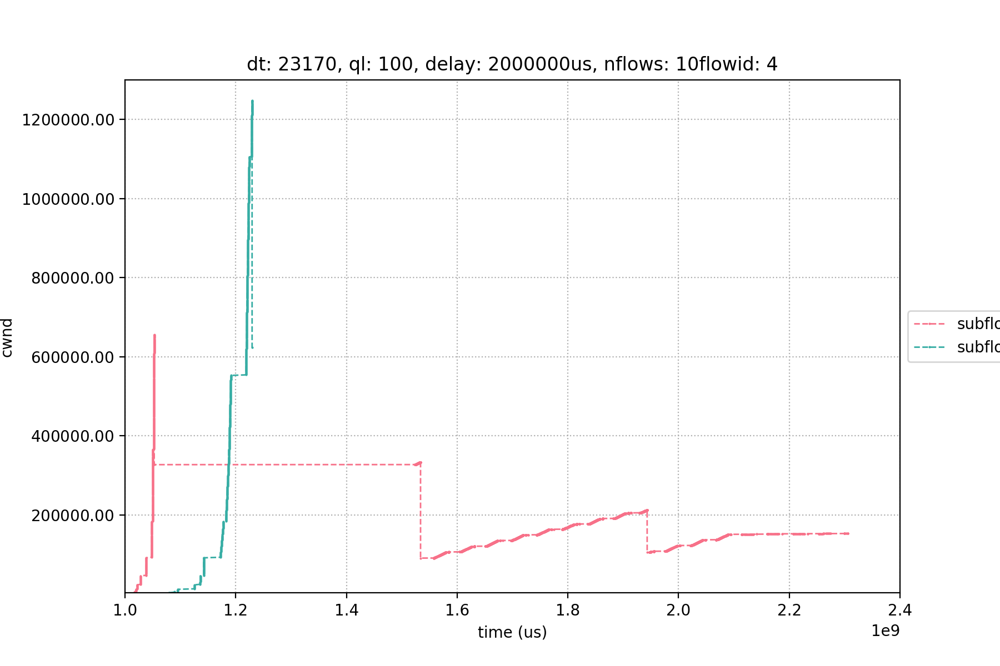

<IPython.core.display.Javascript object>


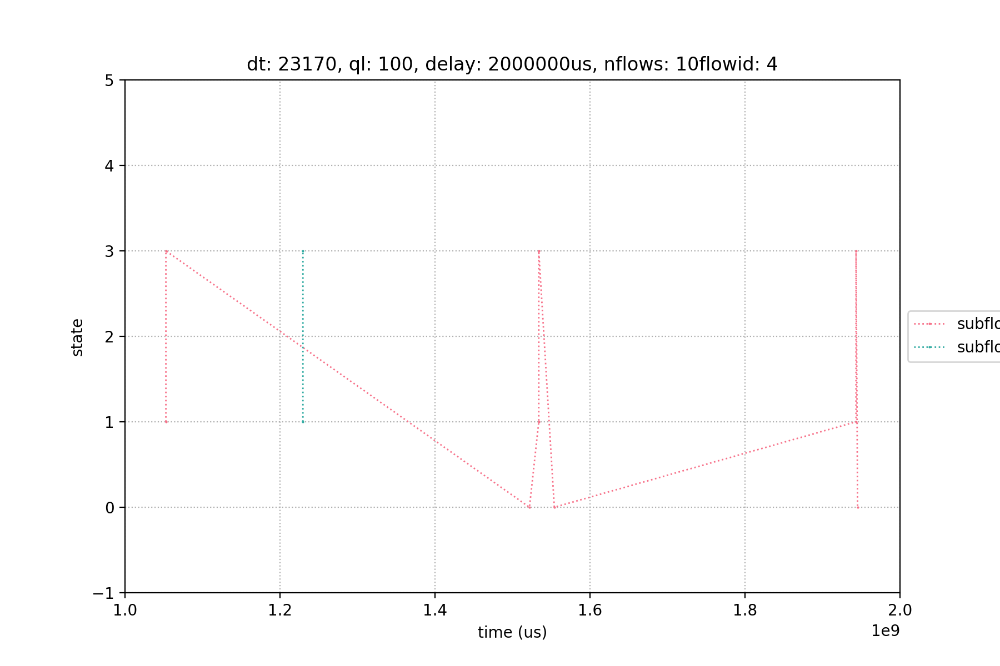

In [245]:
font = {'family' : 'sans',
        'weight' : 'normal',
        'size'   : 10}
matplotlib.rc('font', **font)
%matplotlib notebook
fid = 4
plot_cwnd(pdata, 10, 23170, 100, 2000000, fid, [0,1], markersize=3)
plot_state(pdata, 10, 23170, 100, 2000000, fid, [0,1], markersize=3)
# plot_ql(pdata, 5, 1024, 100, 200, [2, 3], markersize=2)

In [ ]:
%matplotlib notebook
plot_cwnd(pdata, 1, 131072, 100, 2000, 1, [0,1], markersize=2, directory=".")
plot_state(pdata, 1, 131072, 100, 2000, 1, [0,1], markersize=2, directory=".")

<IPython.core.display.Javascript object>


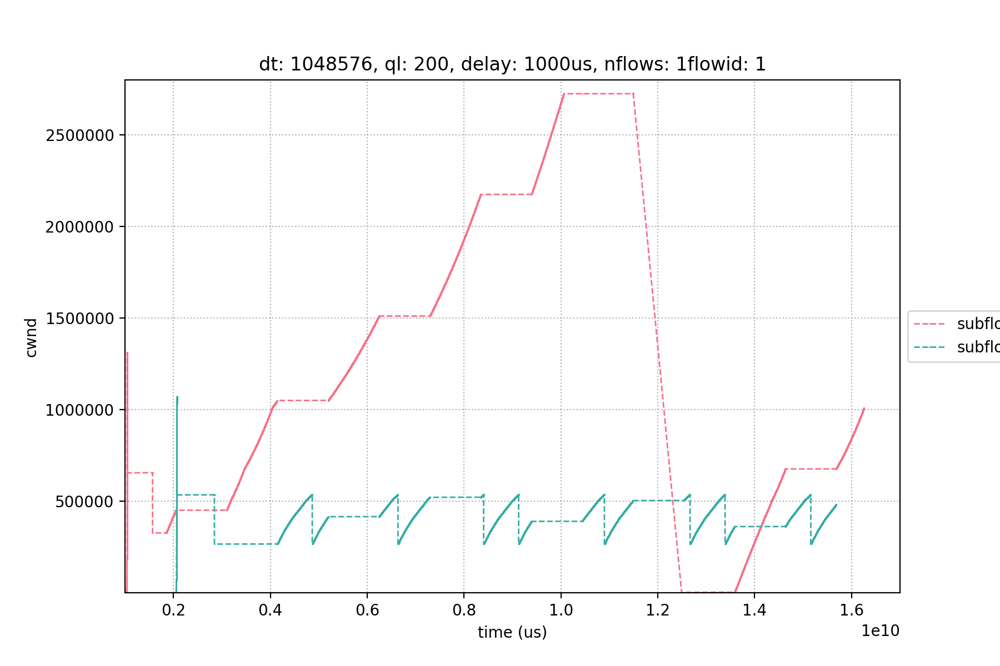

<IPython.core.display.Javascript object>


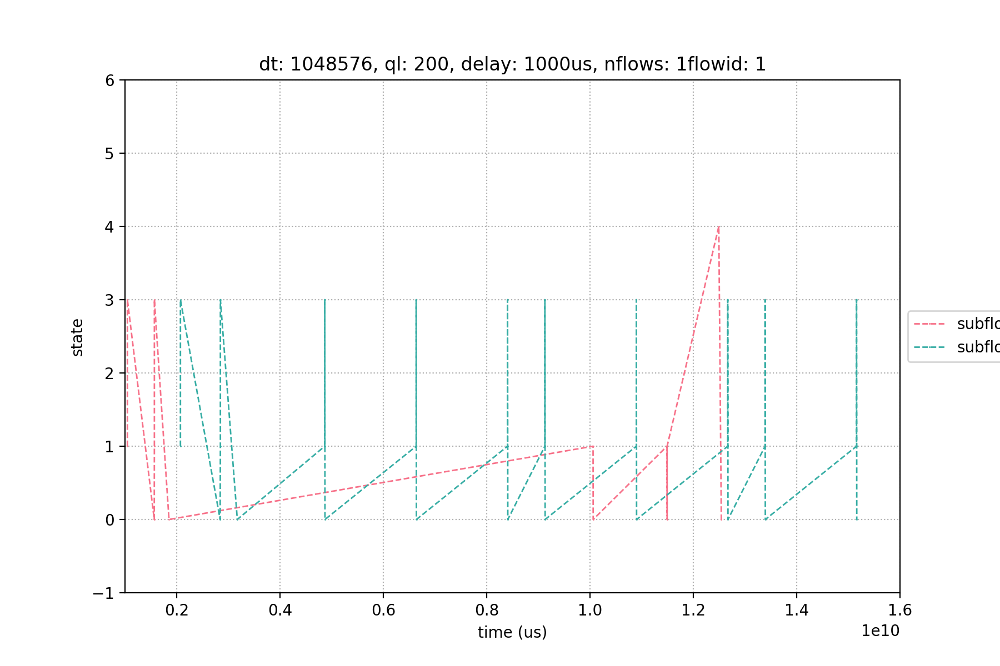

In [122]:
%matplotlib notebook
plot_cwnd(pdata, 1, 1048576, 200, 1000, 1, [0,1], markersize=2)
plot_state(pdata, 1, 1048576, 200, 1000, 1, [0,1], markersize=2)



<IPython.core.display.Javascript object>


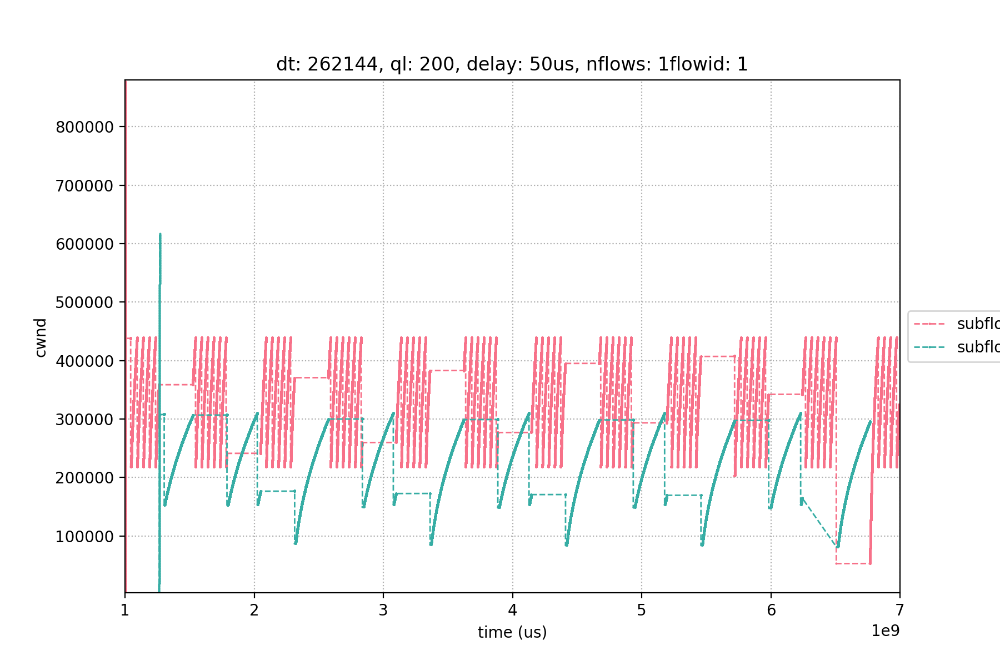

<IPython.core.display.Javascript object>


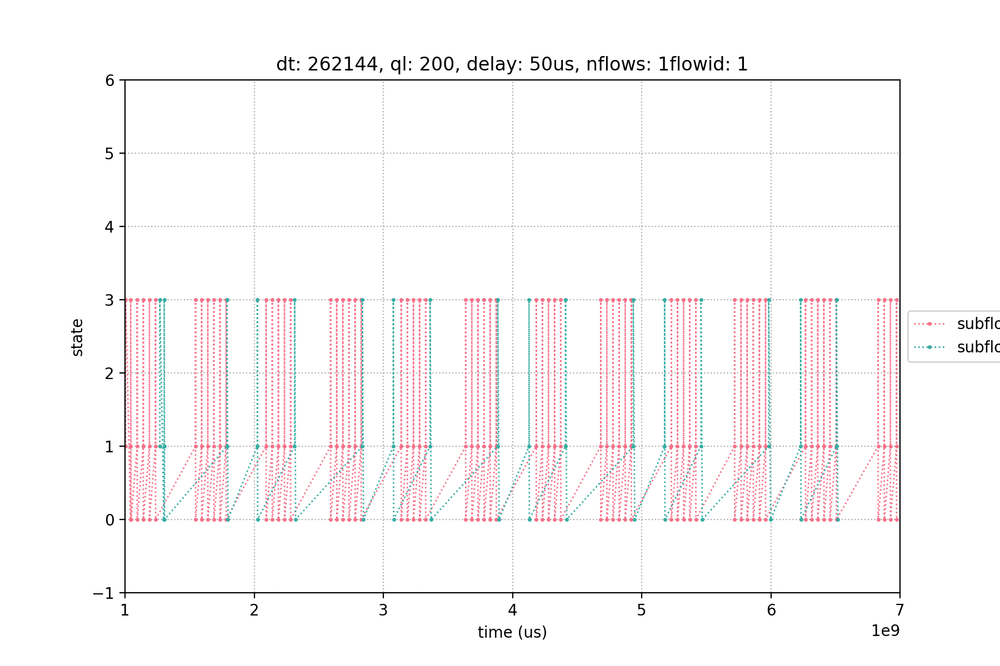

In [146]:
%matplotlib notebook
plot_cwnd(pdata, 1, 262144, 200, 50, 1, [0,1], markersize=3)
plot_state(pdata, 1, 262144, 200, 50, 1, [0,1], markersize=5)

<IPython.core.display.Javascript object>


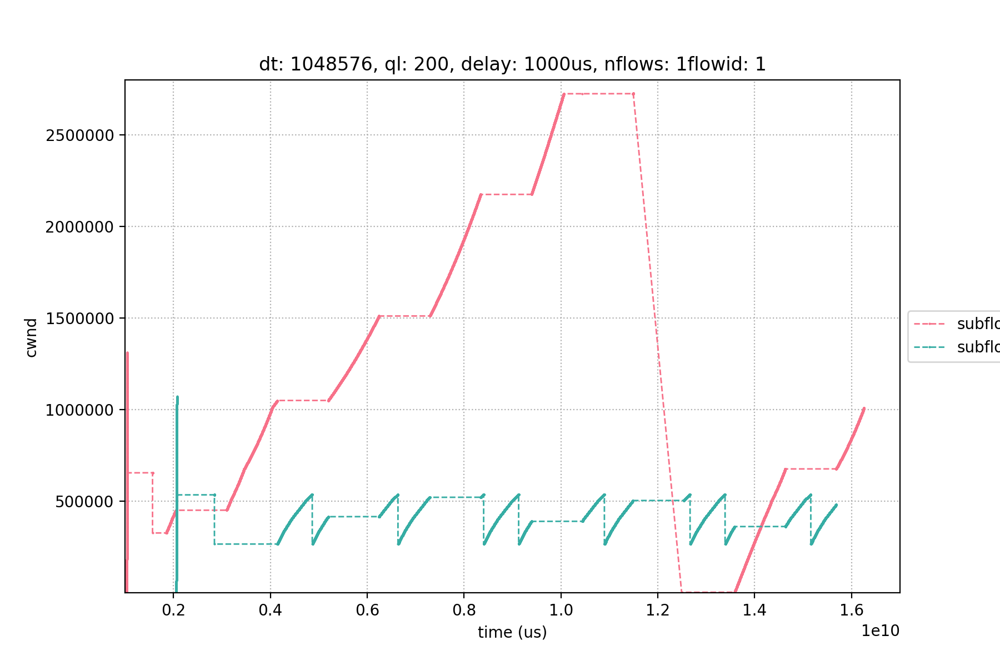

<IPython.core.display.Javascript object>


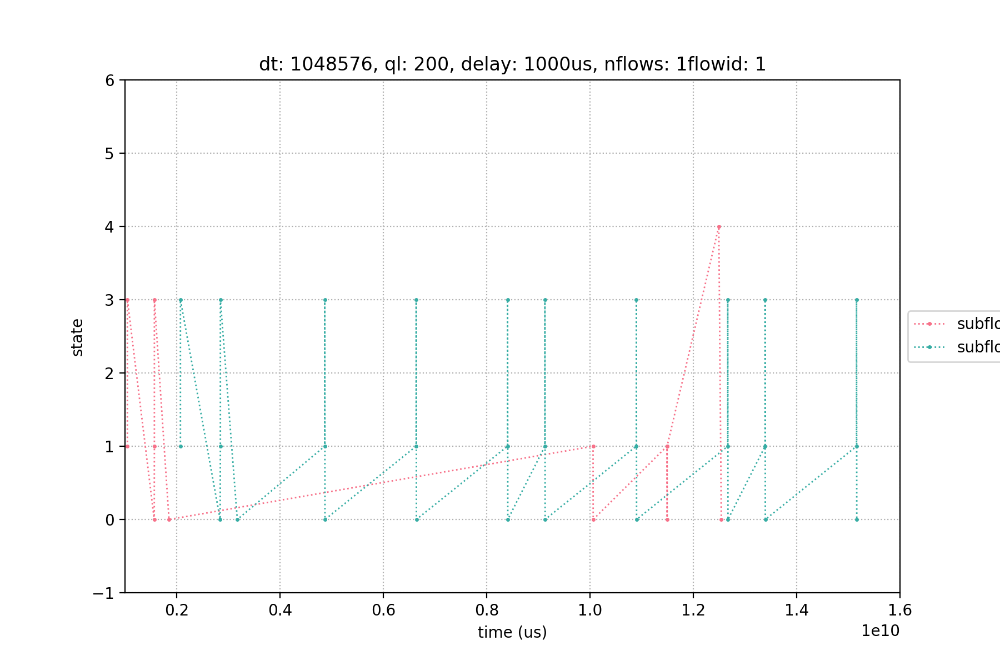

In [134]:
%matplotlib notebook
plot_cwnd(pdata, 1, 23170, 200, 1000, 1, [0,1], markersize=3)
plot_state(pdata, 1, 1048576, 200, 1000, 1, [0,1], markersize=5)

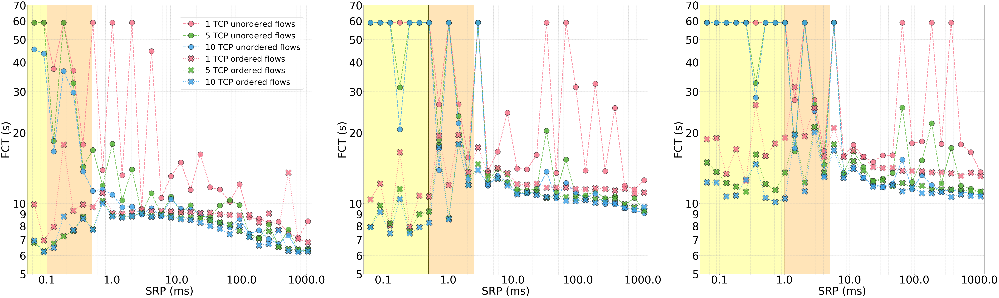

In [193]:
font = {'family' : 'sans',
        'weight' : 'normal',
        'size'   : 60}
matplotlib.rc('font', **font)
all_ql = [100]
all_delay = [100, 500, 1000]
all_nflows = [1, 5, 10]
# ptst = "~/final_logs/finalpdata/pdataCD"
ptst = "/home/wew168/final_logs/finalpdata/pdataCDBASEORDER"
psim = "/home/wew168/final_logs/finalpdata/pdataCDBASEUNORDER"
# psim = "/home/wew168/ns1/ns-3.29/log_baseline_ddl_unordered/pdata"
pdt = pd.read_csv(ptst, sep='\t', header=None, index_col=None,
                    names=['tstamp', 'srp', 'nflows', 'ql', 'delay', 'FCT', 'retrans', 'rto', 'some','syn', 'rtt'])
pds = pd.read_csv(psim, sep='\t', header=None, index_col=None,
                    names=['tstamp', 'srp', 'nflows', 'ql', 'delay', 'FCT', 'retrans', 'rto', 'syn', 'rtt'])
pavt = (pdt
        .groupby(['nflows', 'srp', 'ql', 'delay'], as_index=False)
        .agg({'FCT': np.mean, 'retrans': np.mean, 'rto': np.mean, 'rtt': np.mean, "syn": np.mean})
       )
pavs = (pds
        .groupby(['nflows', 'srp', 'ql', 'delay'], as_index=False)
        .agg({'FCT': np.mean, 'retrans': np.mean, 'rto': np.mean, 'rtt': np.mean, "syn": np.mean})
       )

pavt['delay'] = pavt['delay'].apply(lambda x: int(x/2000))
pavs['delay'] = pavs['delay'].apply(lambda x: int(x/2000))

pavt['FCT'] = pavt['FCT'].apply(lambda x: x-1000000)
pavs['FCT'] = pavs['FCT'].apply(lambda x: x-1000000)

pavt['FCT'] = pavt['FCT'].apply(lambda x: x/1000000)
pavt['srp'] = pavt['srp'].apply(lambda x: x/1e3)
pavs['FCT'] = pavs['FCT'].apply(lambda x: x/1000000)
pavs['srp'] = pavs['srp'].apply(lambda x: x/1e3)

fig = plt.figure()
ax = None
index = 0
attr = 'FCT'
unit = 's'
for ql in all_ql:
    for delay in all_delay:
        ax = fig.add_subplot(len(all_ql), len(all_delay), index+1)
        plot_single(pavs, ql, delay, attr, [1, 5, 10], ncolors=3, linewidth=4, linestyle="--", markersize=30, marker='o',
                    mew=2, alpha=0.8, unit=unit, ax=ax, xlower=0.050, xupper=1200, ylower=0, yupper=70,
                    flowtype="TCP unordered", vlx=delay/1000, vshadecolor="yellow", vshadealpha=0.05,
                    vlx2=delay*5/1000, vshadecolor2="orange")
        plot_single(pavt, ql, delay, attr, [1, 5, 10], linewidth=4, linestyle=":", markersize=35, marker='X',
                    mew=2, alpha=0.8, unit=unit, ax=ax, xlower=0.050, xupper=1200, ylower=5, yupper=70,
                    flowtype="TCP ordered", vlx=delay/1000, vshadecolor="yellow", vshadealpha=0.05,
                    vlx2=delay*5/1000, vshadecolor2="orange")
        index += 1
        
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc=(0.18, 0.7), frameon=True, ncol=1, fontsize=45)

fig.patch.set_facecolor('white')
fig.set_figheight(25)
fig.set_figwidth(80)
plt.tight_layout()
plt.show()

In [61]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

In [209]:
import os
os.chdir("/home/wew168/ns0b05/log_100ms64retr_cd1")

In [213]:
pdata

,tstamp,srp,nflows,ql,delay,FCT,retrans,rto,syn,rtt
05_17_2020_15_16_02,64,5,100,200000,14285051,0,0,20607,4,614.2
05_17_2020_15_16_11,64,5,100,1000000,45819487,0,0,20872,4,2049.6
05_17_2020_15_16_21,64,5,100,2000000,60000000,0,0,6160,4,4761.2
05_17_2020_15_16_31,90,5,100,200000,16878532,0,0,11094,4,714.8
05_17_2020_15_16_41,90,5,100,1000000,32505402,0,0,3858,4,3985.4
...,...,...,...,...,...,...,...,...,...,...
05_17_2020_16_24_11,741455,10,100,1000000,10239211,3989,10,1263,9,2458.2
05_17_2020_16_24_22,741455,10,100,2000000,11674090,1863,2,445,9,4438.3
05_17_2020_16_24_53,1048576,10,100,200000,7661473,9544,6,7486,9,662.0
05_17_2020_16_25_08,1048576,10,100,1000000,9656223,3868,8,1166,9,2662.3
